In [1]:
import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

print(torch.__version__)
print(torchaudio.__version__)

import librosa
import matplotlib.pyplot as plt

2.8.0+cpu
2.8.0+cpu


In [8]:
from IPython.display import Audio
from matplotlib.patches import Rectangle
from torchaudio.utils import download_asset

torch.random.manual_seed(0)

SAMPLE_SPEECH = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")


def plot_waveform(waveform, sr, title="Waveform", ax=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sr

    if ax is None:
        _, ax = plt.subplots(num_channels, 1)
    ax.plot(time_axis, waveform[0], linewidth=1)
    ax.grid(True)
    ax.set_xlim([0, time_axis[-1]])
    ax.set_title(title)


def plot_spectrogram(specgram, title=None, ylabel="freq_bin", ax=None):
    if ax is None:
        _, ax = plt.subplots(1, 1)
    if title is not None:
        ax.set_title(title)
    ax.set_ylabel(ylabel)
    im = ax.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto", interpolation="nearest")

    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label('Power (db)', rotation=270, labelpad=15)

def plot_fbank(fbank, title=None):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or "Filter bank")
    axs.imshow(fbank, aspect="auto")
    axs.set_ylabel("frequency bin")
    axs.set_xlabel("mel bin")

C:\Users\HOME\AppData\Local\Temp\ipykernel_67552\2269935186.py:7: UserWarning: torchaudio.utils.download.download_asset has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. Please see https://github.com/pytorch/audio/issues/3902 for more information. It will be removed from the 2.9 release. 
  SAMPLE_SPEECH = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")


In [9]:
# Load audio
SPEECH_WAVEFORM, SAMPLE_RATE = torchaudio.load(SAMPLE_SPEECH)

# Define transform
spectrogram = T.Spectrogram(n_fft=512)

# Perform transform
spec = spectrogram(SPEECH_WAVEFORM)

c:\Users\HOME\yunnjj72\.venv\Lib\site-packages\torchaudio\_backend\utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


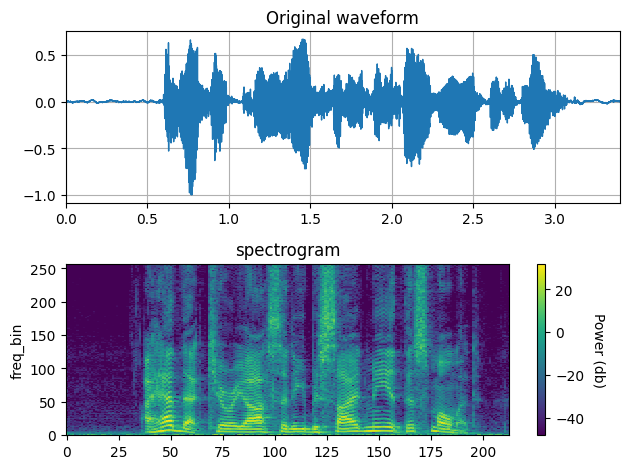

In [10]:
fig, axs = plt.subplots(2, 1)
plot_waveform(SPEECH_WAVEFORM, SAMPLE_RATE, title="Original waveform", ax=axs[0])
plot_spectrogram(spec[0], title="spectrogram", ax=axs[1])
fig.tight_layout()

In [11]:
Audio(SPEECH_WAVEFORM.numpy(), rate=SAMPLE_RATE)

In [12]:
n_ffts = [32, 128, 512, 2048]
hop_length = 64

specs = []
for n_fft in n_ffts:
    spectrogram = T.Spectrogram(n_fft=n_fft, hop_length=hop_length)
    spec = spectrogram(SPEECH_WAVEFORM)
    specs.append(spec)

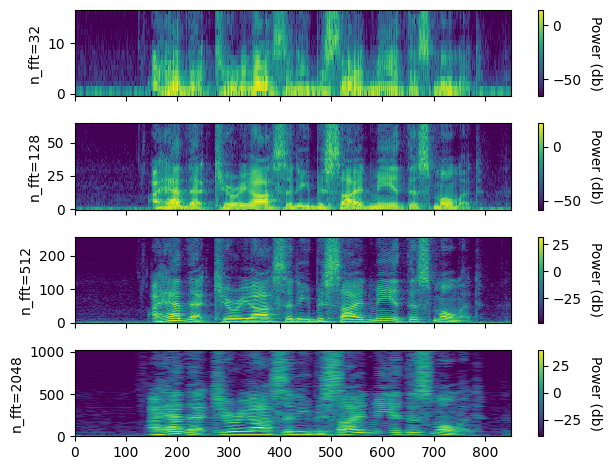

In [13]:
fig, axs = plt.subplots(len(specs), 1, sharex=True)
for i, (spec, n_fft) in enumerate(zip(specs, n_ffts)):
    plot_spectrogram(spec[0], ylabel=f"n_fft={n_fft}", ax=axs[i])
    axs[i].set_xlabel(None)
fig.tight_layout()

In [14]:
# Downsample to half of the original sample rate
speech2 = torchaudio.functional.resample(SPEECH_WAVEFORM, SAMPLE_RATE, SAMPLE_RATE // 2)
# Upsample to the original sample rate
speech3 = torchaudio.functional.resample(speech2, SAMPLE_RATE // 2, SAMPLE_RATE)

In [15]:
# Apply the same spectrogram
spectrogram = T.Spectrogram(n_fft=512)

spec0 = spectrogram(SPEECH_WAVEFORM)
spec2 = spectrogram(speech2)
spec3 = spectrogram(speech3)

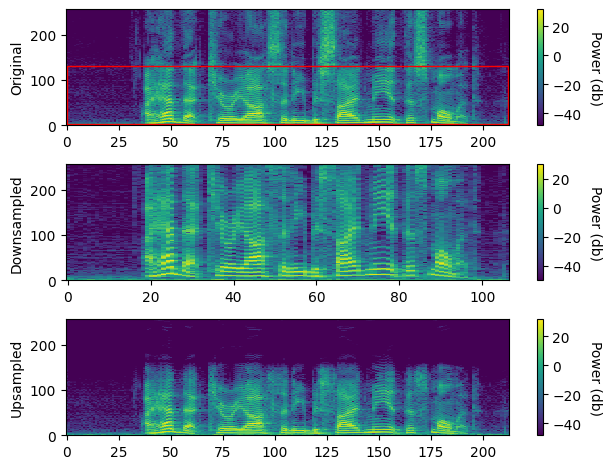

In [16]:
# Visualize it
fig, axs = plt.subplots(3, 1)
plot_spectrogram(spec0[0], ylabel="Original", ax=axs[0])
axs[0].add_patch(Rectangle((0, 3), 212, 128, edgecolor="r", facecolor="none"))
plot_spectrogram(spec2[0], ylabel="Downsampled", ax=axs[1])
plot_spectrogram(spec3[0], ylabel="Upsampled", ax=axs[2])
fig.tight_layout()

In [17]:
# Define transforms
n_fft = 1024
spectrogram = T.Spectrogram(n_fft=n_fft)
griffin_lim = T.GriffinLim(n_fft=n_fft)

# Apply the transforms
spec = spectrogram(SPEECH_WAVEFORM)
reconstructed_waveform = griffin_lim(spec)

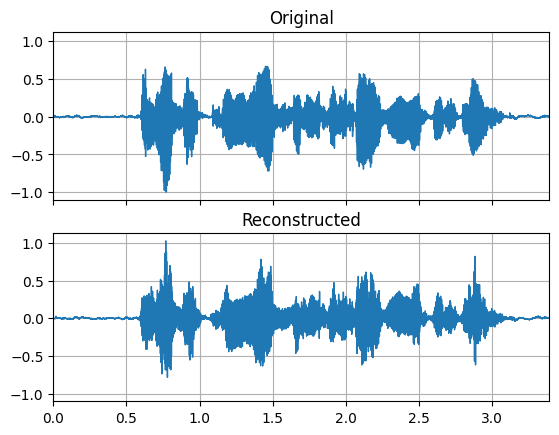

In [18]:
_, axes = plt.subplots(2, 1, sharex=True, sharey=True)
plot_waveform(SPEECH_WAVEFORM, SAMPLE_RATE, title="Original", ax=axes[0])
plot_waveform(reconstructed_waveform, SAMPLE_RATE, title="Reconstructed", ax=axes[1])
Audio(reconstructed_waveform, rate=SAMPLE_RATE)

In [19]:
n_fft = 256
n_mels = 64
sample_rate = 6000

mel_filters = F.melscale_fbanks(
    int(n_fft // 2 + 1),
    n_mels=n_mels,
    f_min=0.0,
    f_max=sample_rate / 2.0,
    sample_rate=sample_rate,
    norm="slaney",
)

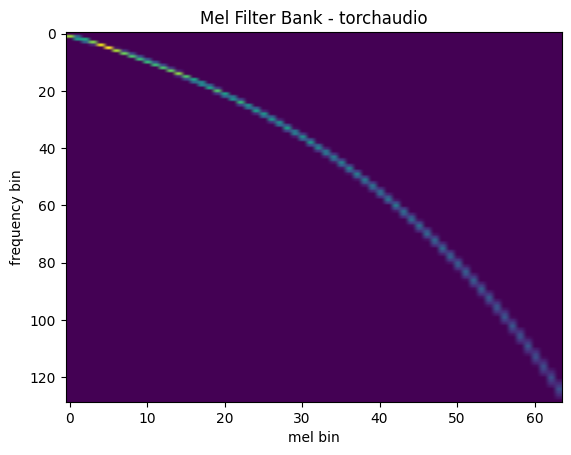

In [20]:
plot_fbank(mel_filters, "Mel Filter Bank - torchaudio")

In [21]:
mel_filters_librosa = librosa.filters.mel(
    sr=sample_rate,
    n_fft=n_fft,
    n_mels=n_mels,
    fmin=0.0,
    fmax=sample_rate / 2.0,
    norm="slaney",
    htk=True,
).T

C:\Users\HOME\AppData\Local\Temp\ipykernel_67552\607204609.py:3: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  mse = torch.square(mel_filters - mel_filters_librosa).mean().item()


Mean Square Difference:  3.9649698287757504e-17


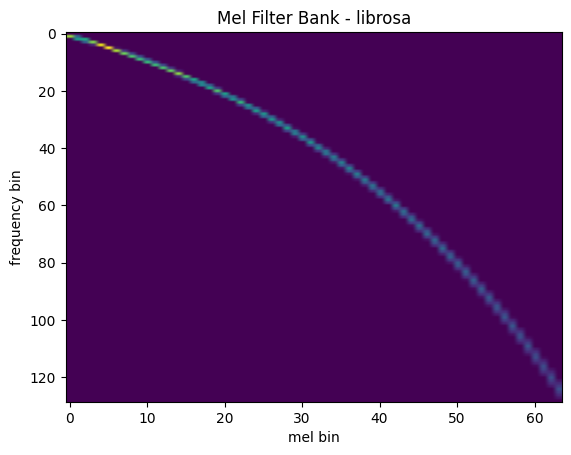

In [22]:
plot_fbank(mel_filters_librosa, "Mel Filter Bank - librosa")

mse = torch.square(mel_filters - mel_filters_librosa).mean().item()
print("Mean Square Difference: ", mse)

In [23]:
n_fft = 1024
win_length = None
hop_length = 512
n_mels = 128

mel_spectrogram = T.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    norm="slaney",
    n_mels=n_mels,
    mel_scale="htk",
)

melspec = mel_spectrogram(SPEECH_WAVEFORM)

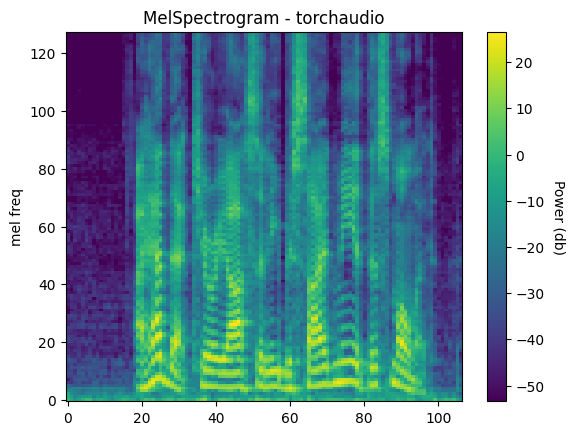

In [24]:
plot_spectrogram(melspec[0], title="MelSpectrogram - torchaudio", ylabel="mel freq")

In [25]:
melspec_librosa = librosa.feature.melspectrogram(
    y=SPEECH_WAVEFORM.numpy()[0],
    sr=sample_rate,
    n_fft=n_fft,
    hop_length=hop_length,
    win_length=win_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    n_mels=n_mels,
    norm="slaney",
    htk=True,
)

C:\Users\HOME\AppData\Local\Temp\ipykernel_67552\2206006589.py:3: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  mse = torch.square(melspec - melspec_librosa).mean().item()


Mean Square Difference:  1.2872729548973894e-09


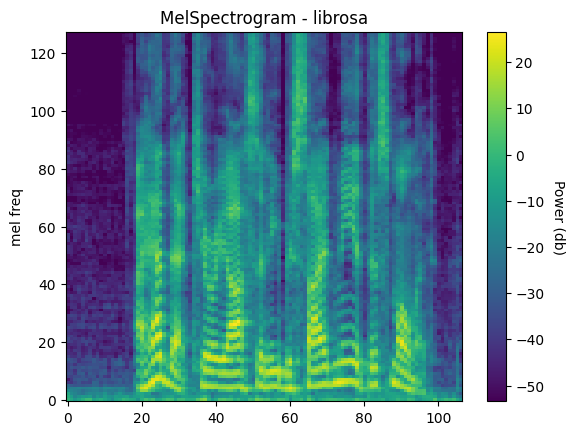

In [26]:
plot_spectrogram(melspec_librosa, title="MelSpectrogram - librosa", ylabel="mel freq")

mse = torch.square(melspec - melspec_librosa).mean().item()
print("Mean Square Difference: ", mse)

In [27]:
n_fft = 2048
win_length = None
hop_length = 512
n_mels = 256
n_mfcc = 256

mfcc_transform = T.MFCC(
    sample_rate=sample_rate,
    n_mfcc=n_mfcc,
    melkwargs={
        "n_fft": n_fft,
        "n_mels": n_mels,
        "hop_length": hop_length,
        "mel_scale": "htk",
    },
)

mfcc = mfcc_transform(SPEECH_WAVEFORM)

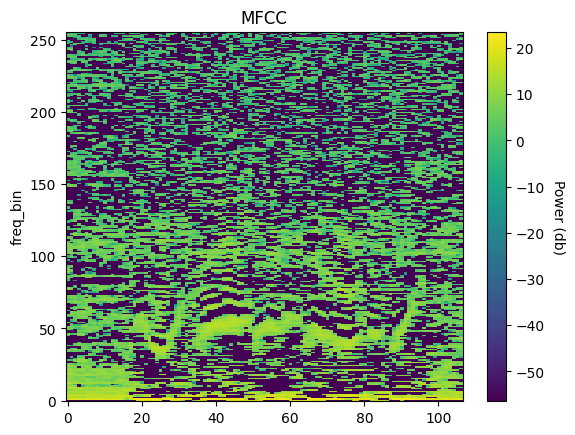

In [28]:
plot_spectrogram(mfcc[0], title="MFCC")

In [29]:
melspec = librosa.feature.melspectrogram(
    y=SPEECH_WAVEFORM.numpy()[0],
    sr=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    n_mels=n_mels,
    htk=True,
    norm=None,
)

mfcc_librosa = librosa.feature.mfcc(
    S=librosa.core.spectrum.power_to_db(melspec),
    n_mfcc=n_mfcc,
    dct_type=2,
    norm="ortho",
)

C:\Users\HOME\AppData\Local\Temp\ipykernel_67552\1658487374.py:3: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  mse = torch.square(mfcc - mfcc_librosa).mean().item()


Mean Square Difference:  0.810401439666748


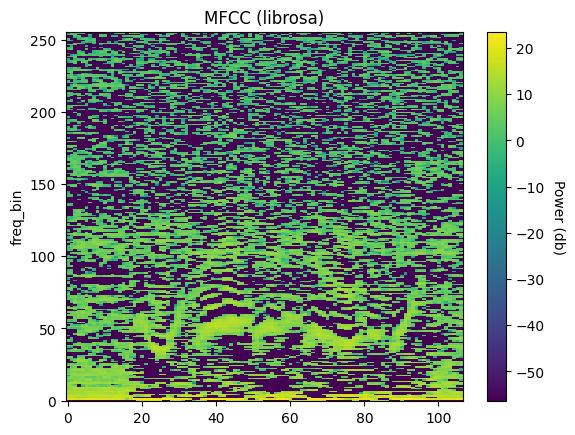

In [30]:
plot_spectrogram(mfcc_librosa, title="MFCC (librosa)")

mse = torch.square(mfcc - mfcc_librosa).mean().item()
print("Mean Square Difference: ", mse)

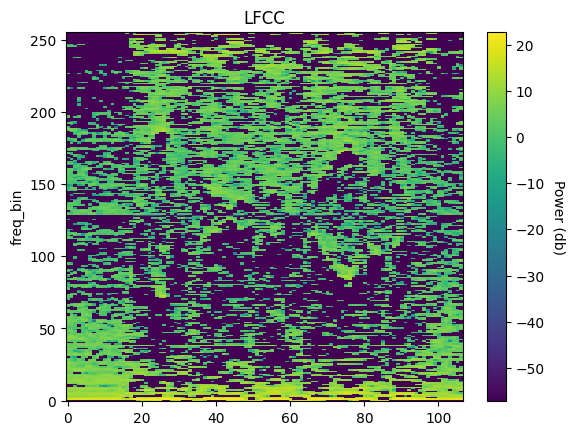

In [31]:
n_fft = 2048
win_length = None
hop_length = 512
n_lfcc = 256

lfcc_transform = T.LFCC(
    sample_rate=sample_rate,
    n_lfcc=n_lfcc,
    speckwargs={
        "n_fft": n_fft,
        "win_length": win_length,
        "hop_length": hop_length,
    },
)

lfcc = lfcc_transform(SPEECH_WAVEFORM)
plot_spectrogram(lfcc[0], title="LFCC")

In [32]:
pitch = F.detect_pitch_frequency(SPEECH_WAVEFORM, SAMPLE_RATE)

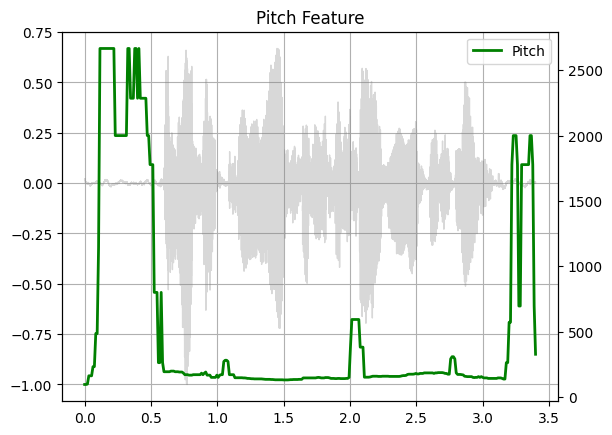

In [33]:
def plot_pitch(waveform, sr, pitch):
    figure, axis = plt.subplots(1, 1)
    axis.set_title("Pitch Feature")
    axis.grid(True)

    end_time = waveform.shape[1] / sr
    time_axis = torch.linspace(0, end_time, waveform.shape[1])
    axis.plot(time_axis, waveform[0], linewidth=1, color="gray", alpha=0.3)

    axis2 = axis.twinx()
    time_axis = torch.linspace(0, end_time, pitch.shape[1])
    axis2.plot(time_axis, pitch[0], linewidth=2, label="Pitch", color="green")

    axis2.legend(loc=0)


plot_pitch(SPEECH_WAVEFORM, SAMPLE_RATE, pitch)

In [34]:
import torch
import torchaudio

print(torch.__version__)
print(torchaudio.__version__)

torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

2.8.0+cpu
2.8.0+cpu
cpu


In [35]:
import IPython
import matplotlib.pyplot as plt
from torchaudio.utils import download_asset

SPEECH_FILE = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")

C:\Users\HOME\AppData\Local\Temp\ipykernel_67552\499805210.py:5: UserWarning: torchaudio.utils.download.download_asset has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. Please see https://github.com/pytorch/audio/issues/3902 for more information. It will be removed from the 2.9 release. 
  SPEECH_FILE = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")


In [36]:
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H

print("Sample Rate:", bundle.sample_rate)

print("Labels:", bundle.get_labels())

Sample Rate: 16000
Labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [37]:
model = bundle.get_model().to(device)

print(model.__class__)

0.0%

Downloading: "https://download.pytorch.org/torchaudio/models/wav2vec2_fairseq_base_ls960_asr_ls960.pth" to C:\Users\HOME/.cache\torch\hub\checkpoints\wav2vec2_fairseq_base_ls960_asr_ls960.pth


100.0%


<class 'torchaudio.models.wav2vec2.model.Wav2Vec2Model'>


In [38]:
IPython.display.Audio(SPEECH_FILE)

In [39]:
waveform, sample_rate = torchaudio.load(SPEECH_FILE)
waveform = waveform.to(device)

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

c:\Users\HOME\yunnjj72\.venv\Lib\site-packages\torchaudio\_backend\utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(


In [40]:
with torch.inference_mode():
    features, _ = model.extract_features(waveform)

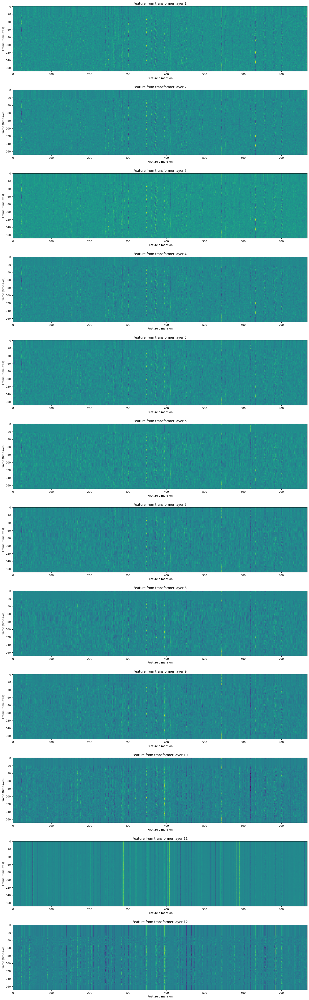

In [41]:
fig, ax = plt.subplots(len(features), 1, figsize=(16, 4.3 * len(features)))
for i, feats in enumerate(features):
    ax[i].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i].set_title(f"Feature from transformer layer {i+1}")
    ax[i].set_xlabel("Feature dimension")
    ax[i].set_ylabel("Frame (time-axis)")
fig.tight_layout()

In [42]:
with torch.inference_mode():
    emission, _ = model(waveform)

Class labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


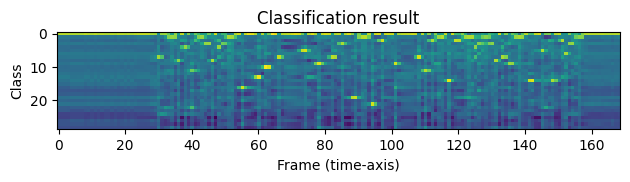

In [43]:
plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.tight_layout()
print("Class labels:", bundle.get_labels())

In [44]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)
        indices = [i for i in indices if i != self.blank]
        return "".join([self.labels[i] for i in indices])

In [45]:
decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])

In [48]:
print(transcript)
IPython.display.Audio(SPEECH_FILE)

I|HAD|THAT|CURIOSITY|BESIDE|ME|AT|THIS|MOMENT|


In [23]:
import torch
import torchaudio

torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

cpu


In [24]:
import IPython
import matplotlib.pyplot as plt
from torchaudio.transforms import Resample

SPEECH_FILE = "week4.wav"

In [25]:
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H

print("Sample Rate:", bundle.sample_rate)

print("Labels:", bundle.get_labels())

Sample Rate: 16000
Labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [26]:
model = bundle.get_model().to(device)

print(model.__class__)

<class 'torchaudio.models.wav2vec2.model.Wav2Vec2Model'>


In [27]:
IPython.display.Audio(SPEECH_FILE)

In [28]:
waveform, sample_rate = torchaudio.load(SPEECH_FILE)
waveform = waveform.to(device)

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

In [29]:
with torch.inference_mode():
    features, _ = model.extract_features(waveform)

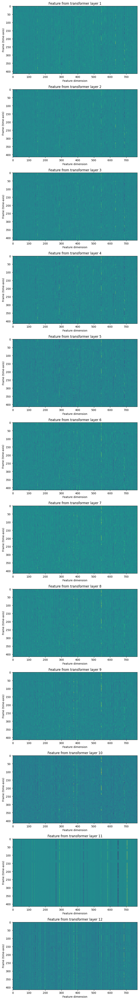

In [30]:
fig, ax = plt.subplots(len(features), 1, figsize=(16, 4.3 * len(features)))
for i, feats in enumerate(features):
    ax[i].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i].set_title(f"Feature from transformer layer {i+1}")
    ax[i].set_xlabel("Feature dimension")
    ax[i].set_ylabel("Frame (time-axis)")
fig.tight_layout()

In [31]:
with torch.inference_mode():
    emission, _ = model(waveform)

Class labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


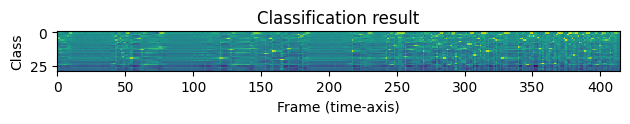

In [32]:
plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.tight_layout()
print("Class labels:", bundle.get_labels())

In [33]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)
        indices = [i for i in indices if i != self.blank]
        return "".join([self.labels[i] for i in indices])

In [34]:
decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])

In [40]:
print(transcript)
IPython.display.Audio(SPEECH_FILE)

O|NOH|YOU|YOU|COMPLETE|ME|YOU'RE|GARMETE|YOUR|GILLS|FOR|MONEY|DON'T|TALK|LIKE|ONE|OF|THEM|YOU'RE|NOW|


In [ ]:
import torch
import torchaudio
import torchaudio.transforms as T
import torchaudio.functional as F
import librosa
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from IPython.display import Audio

torch.random.manual_seed(0)

# 1. 내 음성 파일 불러오기 (wav)
SPEECH_FILE = "week4.wav"
SPEECH_WAVEFORM, SAMPLE_RATE = torchaudio.load(SPEECH_FILE)

In [42]:
def plot_waveform(waveform, sr, title="Waveform", ax=None):
    waveform = waveform.numpy()
    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sr
    if ax is None:
        _, ax = plt.subplots(num_channels, 1)
    ax.plot(time_axis, waveform[0], linewidth=1)
    ax.grid(True)
    ax.set_xlim([0, time_axis[-1]])
    ax.set_title(title)

def plot_spectrogram(specgram, title=None, ylabel="freq_bin", ax=None):
    if ax is None:
        _, ax = plt.subplots(1, 1)
    if title is not None:
        ax.set_title(title)
    ax.set_ylabel(ylabel)
    im = ax.imshow(librosa.power_to_db(specgram), origin="lower",
                   aspect="auto", interpolation="nearest")
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label('Power (db)', rotation=270, labelpad=15)

def plot_fbank(fbank, title=None):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or "Filter bank")
    axs.imshow(fbank, aspect="auto")
    axs.set_ylabel("frequency bin")
    axs.set_xlabel("mel bin")

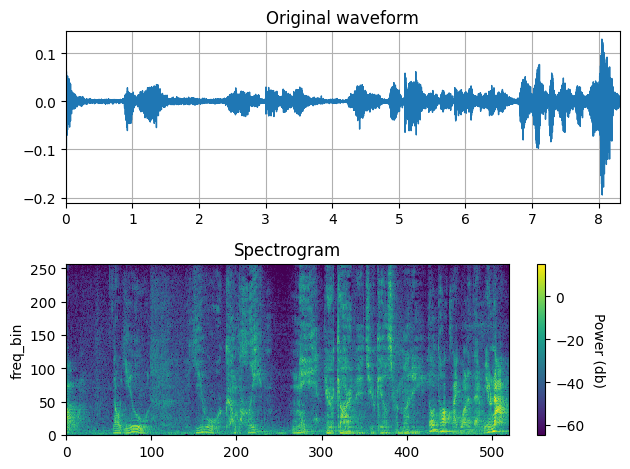

In [43]:
spectrogram = T.Spectrogram(n_fft=512)
spec = spectrogram(SPEECH_WAVEFORM)

fig, axs = plt.subplots(2, 1)
plot_waveform(SPEECH_WAVEFORM, SAMPLE_RATE, title="Original waveform", ax=axs[0])
plot_spectrogram(spec[0], title="Spectrogram", ax=axs[1])
fig.tight_layout()

Audio(SPEECH_WAVEFORM.numpy(), rate=SAMPLE_RATE)

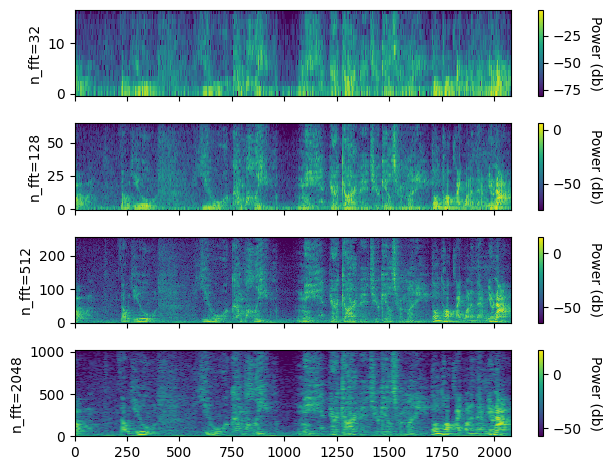

In [44]:
n_ffts = [32, 128, 512, 2048]
hop_length = 64
specs = []
for n_fft in n_ffts:
    spectrogram = T.Spectrogram(n_fft=n_fft, hop_length=hop_length)
    spec = spectrogram(SPEECH_WAVEFORM)
    specs.append(spec)

fig, axs = plt.subplots(len(specs), 1, sharex=True)
for i, (spec, n_fft) in enumerate(zip(specs, n_ffts)):
    plot_spectrogram(spec[0], ylabel=f"n_fft={n_fft}", ax=axs[i])
    axs[i].set_xlabel(None)
fig.tight_layout()

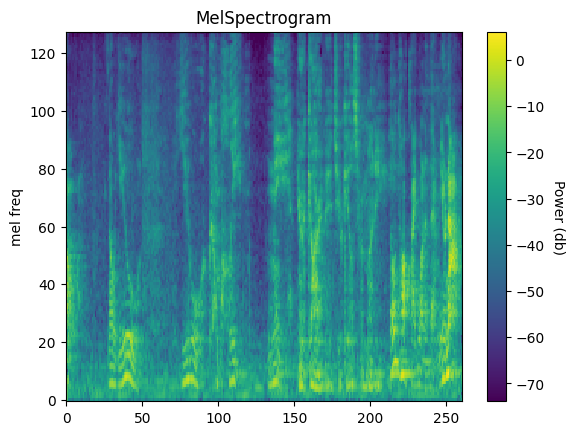

In [45]:
n_fft = 1024
win_length = None
hop_length = 512
n_mels = 128

mel_spectrogram = T.MelSpectrogram(
    sample_rate=SAMPLE_RATE,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    n_mels=n_mels,
    power=2.0,
    norm="slaney",
    mel_scale="htk",
)

melspec = mel_spectrogram(SPEECH_WAVEFORM)
plot_spectrogram(melspec[0], title="MelSpectrogram", ylabel="mel freq")

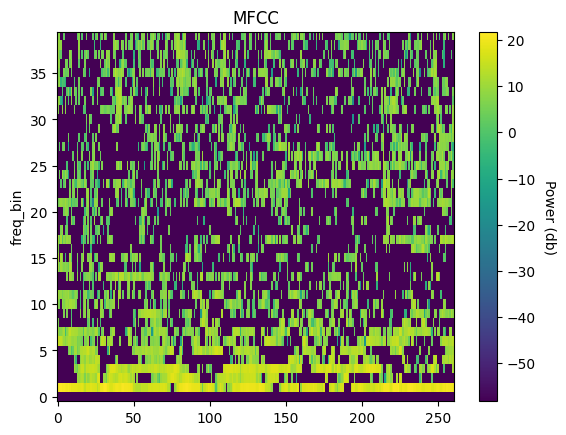

In [46]:
n_mfcc = 40
mfcc_transform = T.MFCC(
    sample_rate=SAMPLE_RATE,
    n_mfcc=n_mfcc,
    melkwargs={
        "n_fft": n_fft,
        "n_mels": n_mels,
        "hop_length": hop_length,
        "mel_scale": "htk",
    },
)
mfcc = mfcc_transform(SPEECH_WAVEFORM)
plot_spectrogram(mfcc[0], title="MFCC")

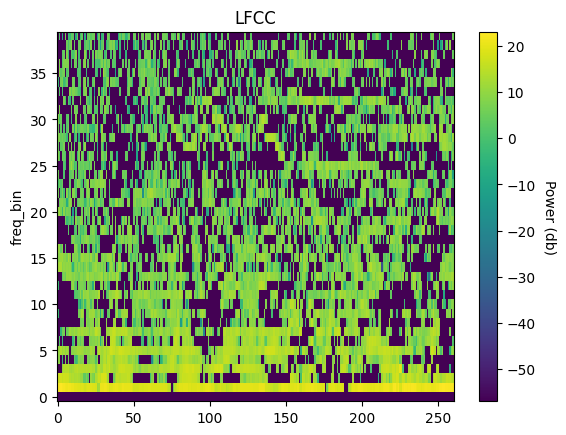

In [47]:
n_lfcc = 40
lfcc_transform = T.LFCC(
    sample_rate=SAMPLE_RATE,
    n_lfcc=n_lfcc,
    speckwargs={
        "n_fft": n_fft,
        "win_length": win_length,
        "hop_length": hop_length,
    },
)
lfcc = lfcc_transform(SPEECH_WAVEFORM)
plot_spectrogram(lfcc[0], title="LFCC")

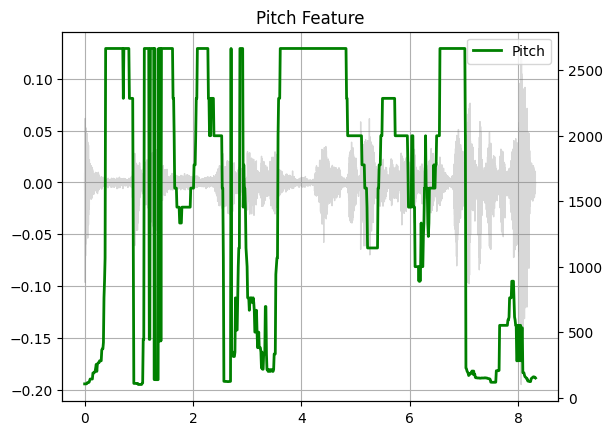

In [48]:
pitch = F.detect_pitch_frequency(SPEECH_WAVEFORM, SAMPLE_RATE)

def plot_pitch(waveform, sr, pitch):
    figure, axis = plt.subplots(1, 1)
    axis.set_title("Pitch Feature")
    axis.grid(True)
    end_time = waveform.shape[1] / sr
    time_axis = torch.linspace(0, end_time, waveform.shape[1])
    axis.plot(time_axis, waveform[0], linewidth=1, color="gray", alpha=0.3)
    axis2 = axis.twinx()
    time_axis = torch.linspace(0, end_time, pitch.shape[1])
    axis2.plot(time_axis, pitch[0], linewidth=2, label="Pitch", color="green")
    axis2.legend(loc=0)

plot_pitch(SPEECH_WAVEFORM, SAMPLE_RATE, pitch)

In [ ]:
# 1. 내 오디오 불러오기
SPEECH_FILE = "week4.wav"
waveform, sample_rate = torchaudio.load(SPEECH_FILE)

# mono + 16kHz
if waveform.size(0) > 1:
    waveform = waveform.mean(dim=0, keepdim=True)
if sample_rate != 16000:
    waveform = T.Resample(orig_freq=sample_rate, new_freq=16000)(waveform)
sample_rate = 16000

# 2. Feature 추출기 정의
spec_transform = T.Spectrogram(n_fft=400)
mel_transform = T.MelSpectrogram(sample_rate=sample_rate, n_mels=80)
mfcc_transform = T.MFCC(sample_rate=sample_rate, n_mfcc=13)

features = {
    "waveform": waveform,
    "spectrogram": spec_transform(waveform),
    "mel": mel_transform(waveform),
    "mfcc": mfcc_transform(waveform)
}

# 3. 간단한 Classifier 정의
class SimpleASR(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, num_classes=29):  # 29 = 영어 알파벳 + blank
        super().__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True, bidirectional=True)
        self.fc = nn.Linear(hidden_dim*2, num_classes)

    def forward(self, x):
        output, _ = self.lstm(x)
        output = self.fc(output)
        return output

# 4. 입력 차원 맞추기
def prepare_input(feat):
    if feat.dim() == 2:  # waveform
        feat = feat.unsqueeze(0)  # [1, time]
    elif feat.dim() == 3:  # spec/mel/mfcc
        feat = feat.squeeze(0).transpose(0,1).unsqueeze(0)  # [1, time, feat_dim]
    return feat

# 5. 모델 초기화 & 예측
models = {
    "spectrogram": SimpleASR(input_dim=features["spectrogram"].shape[1]),
    "mel": SimpleASR(input_dim=features["mel"].shape[1]),
    "mfcc": SimpleASR(input_dim=features["mfcc"].shape[1])
}

for name, feat in features.items():
    if name == "waveform":
        print(f"[Baseline Wav2Vec2는 이미 실행 완료: {name}]")
        continue
    inp = prepare_input(feat)
    model = models[name]
    with torch.no_grad():
        out = model(inp)
    print(f"{name} feature → output shape:", out.shape)


[Baseline Wav2Vec2는 이미 실행 완료: waveform]
spectrogram feature → output shape: torch.Size([1, 666, 29])
mel feature → output shape: torch.Size([1, 666, 29])
mfcc feature → output shape: torch.Size([1, 666, 29])


In [ ]:
import torch
import math


labels = bundle.get_labels()
blank_id = 0 

# 1) Greedy 디코더 (이미 사용했던 것)
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        indices = torch.argmax(emission, dim=-1)  # [T]
        indices = torch.unique_consecutive(indices, dim=-1)  # collapse repeats
        indices = [i.item() for i in indices if i != self.blank]  # remove blank
        return "".join([self.labels[i] for i in indices])

greedy_decoder = GreedyCTCDecoder(labels, blank=blank_id)
greedy_text = greedy_decoder(emission[0])
print("[Greedy] :", greedy_text)


# 2) 순수 파이썬 CTC Prefix Beam Search (언어모델 없음)
def logsumexp(a, b):
    """stable log(exp(a)+exp(b))"""
    if a == -float("inf"):
        return b
    if b == -float("inf"):
        return a
    m = a if a > b else b
    return m + math.log1p(math.exp(-abs(a - b)))

def ctc_prefix_beam_search(emission_t, beam_width=10, blank=0):
    """
    emission_t: Tensor [T, C] (logits 또는 log-prob)
    beam_width: 빔 크기
    반환: (best_text, best_logp)
    """
    # log softmax로 변환
    logp = torch.log_softmax(emission_t, dim=-1).cpu().tolist()  # list of length T, each length C

    # 각 prefix에 대해 (p_b, p_nb) = (blank로 끝나는 확률, non-blank로 끝나는 확률) in log-domain
    beams = {(): (0.0, -float("inf"))}  # empty prefix: log(1)=0
    for frame in logp:
        # 매 프레임마다 상위 beam_width 후보 토큰만 확장
        top = sorted(range(len(frame)), key=lambda k: frame[k], reverse=True)[:max(beam_width, 2)]
        new_beams = {}
        for prefix, (pb, pnb) in beams.items():
            for c in top:
                p = frame[c]
                if c == blank:
                    # blank로 끝나는 경우: (prefix 그대로, blank 확률 업데이트)
                    nb = new_beams.get(prefix, (-float("inf"), -float("inf")))
                    new_pb = logsumexp(nb[0], pb + p)  # 기존 blank 누적 vs 이번에 blank 추가
                    new_pnb = nb[1]
                    new_beams[prefix] = (new_pb, new_pnb)
                else:
                    last = prefix[-1] if len(prefix) > 0 else None
                    # case1: 같은 문자를 연속으로 이어붙이지 않음 (CTC 규칙)
                    new_prefix_same = prefix
                    # case2: 새로운 문자를 추가하는 경우
                    new_prefix_add = prefix + (c,)

                    # non-blank로 끝나는 누적 업데이트
                    if c == last:
                        # 동일 문자가 연속: 이전이 non-blank였으면 반복 금지 → blank 통해서만 가능
                        nb = new_beams.get(new_prefix_same, (-float("inf"), -float("inf")))
                        new_pnb_same = logsumexp(nb[1], pnb + p)  # 같은 prefix 유지 + non-blank로 끝남
                        new_beams[new_prefix_same] = (nb[0], new_pnb_same)
                    else:
                        # 새로운 토큰 추가
                        nb = new_beams.get(new_prefix_add, (-float("inf"), -float("inf")))
                        new_pnb_add = logsumexp(nb[1], (pb + p))  # 이전이 blank → 새 글자
                        new_pnb_add = logsumexp(new_pnb_add, (pnb + p))  # 이전이 non-blank → 새 글자(다른 글자)
                        new_beams[new_prefix_add] = (nb[0], new_pnb_add)

        # 상위 beam_width개만 유지
        beams = dict(sorted(new_beams.items(),
                            key=lambda kv: logsumexp(kv[1][0], kv[1][1]),
                            reverse=True)[:beam_width])

    # 최종 최고 스코어 prefix 선택
    best_prefix, (pb, pnb) = max(beams.items(), key=lambda kv: logsumexp(kv[1][0], kv[1][1]))
    best_seq = list(best_prefix)

    # 토큰 시퀀스를 문자로 변환
    text = "".join(labels[i] for i in best_seq if i != blank)
    return text, logsumexp(pb, pnb)

beam_text, beam_score = ctc_prefix_beam_search(emission[0], beam_width=25, blank=blank_id)
print("[Beam-Search] :", beam_text)


[Greedy] : O|NOH|YOU|YOU|COMPLETE|ME|YOU'RE|GARMETE|YOUR|GILLS|FOR|MONEY|DON'T|TALK|LIKE|ONE|OF|THEM|YOU'RE|NOW|
[Beam-Search] : OU'L'L|H|U|U|B|BWB|BU|YOU|'W'L'L|COM|PALAETE|Y|U|B|U|Y|O|N|KM|EAT|YU|YTYOU'RE|GHUARAM|NENTES|YOU'R|GUAILELES|FROR|MONEY|U|DON'T|TEALK|LIKE|ONE|OF|THEM|YOU|'RE|NOW|
